In [6]:
!ls "../SET DE DATOS/UNIDO"

 2013-no-25-Fertilizantes-en-Argentina.-Análisis-del-consumo.pdf
 CALIDAD_AIRE.xlsx
 CLIMA
 estimaciones-agricolas-2023-10.csv
 estimacion-siembra-cosecha-minagricultura.csv
'HECTAREAS COSECHADAS_cereales_generico.xls'
 informe_indec_censo2018.xlsx
 INTENSIDAD-USO-PLAGUICIDAS.xlsx
 RIEGO.xlsx
 siembra-serie
 siembra-serie-anual
 superficie-afectada-por-incendios-forestales-2019-07-05.csv
 SUPERFICIE-IMPLANTADA-CEREAL_POCOS_DATOS.xlsx
'USO DE FERTILIZANTES'
 USO-DE-PLAGUICIDAS.xlsx
 USO-DE-SUELO-TIPO-DE-SIEMBRA.xlsx


In [211]:
destino_archivos =  "../SET DE DATOS/PROCESADOS/"

In [9]:
# Importamos las librerias necesarias
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [11]:
# Abrimos el set de datos y convertimos en DataFrame
df_estimacion_siembra = pd.read_csv('../SET DE DATOS/UNIDO/estimacion-siembra-cosecha-minagricultura.csv', encoding='latin-1',sep=';')

In [13]:
# Inspección visual de al DataFrame
df_estimacion_siembra

,Cultivo,Campaña,Provincia,idProvincia,Sup. Sembrada,Sup. Cosechada,Producción,Rendimiento
0,Ajo,1969/70,BUENOS AIRES,6,5290,5290,23458,4434
1,Ajo,1970/71,BUENOS AIRES,6,5690,5620,25358,4512
2,Ajo,1971/72,BUENOS AIRES,6,5960,5930,26860,4530
3,Ajo,1972/73,BUENOS AIRES,6,6640,6600,32658,4948
4,Ajo,1973/74,BUENOS AIRES,6,7690,7685,39959,5200
...,...,...,...,...,...,...,...,...
12683,Yerba mate,2015/16,MISIONES,54,145911,143760,695829,4840
12684,Yerba mate,2016/17,MISIONES,54,147501,147501,591713,4012
12685,Yerba mate,2017/18,MISIONES,54,148965,148965,703834,4725
12686,Yerba mate,2018/19,MISIONES,54,150592,150592,728600,4838


In [15]:
# Vemos como estan conformadas las columnas
df_estimacion_siembra.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12688 entries, 0 to 12687
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Cultivo         12688 non-null  object
 1   Campaña         12688 non-null  object
 2   Provincia       12688 non-null  object
 3   idProvincia     12688 non-null  int64 
 4   Sup. Sembrada   12688 non-null  object
 5   Sup. Cosechada  12688 non-null  object
 6   Producción      12688 non-null  int64 
 7   Rendimiento     12688 non-null  object
dtypes: int64(2), object(6)
memory usage: 793.1+ KB


In [17]:
# Se intento hacer una converción de formato para los valores que a simple vista son numericos pero dio un error
# Filtramos para ver el error que nos dio
df_estimacion_siembra[df_estimacion_siembra['Sup. Sembrada'] == "SD"]
# Hay registros que figuran como SD porque son arboles, no llevan un proceso de sembrado/cosechado por lo que vamos a reemplazar esos valores por los obtenidos en produccion

,Cultivo,Campaña,Provincia,idProvincia,Sup. Sembrada,Sup. Cosechada,Producción,Rendimiento
2259,Banana,1971/72,CORRIENTES,18,SD,SD,100,SD
2260,Banana,1973/74,CORRIENTES,18,SD,SD,4360,SD
2261,Banana,1974/75,CORRIENTES,18,SD,SD,4010,SD
2262,Banana,1975/76,CORRIENTES,18,SD,SD,3960,SD
2275,Banana,1969/70,FORMOSA,34,SD,SD,200100,SD
...,...,...,...,...,...,...,...,...
8790,Pomelo,1971/72,TUCUMAN,90,SD,SD,13200,SD
8791,Pomelo,1972/73,TUCUMAN,90,SD,SD,24700,SD
8792,Pomelo,1973/74,TUCUMAN,90,SD,SD,23400,SD
8793,Pomelo,1974/75,TUCUMAN,90,SD,SD,29000,SD


In [20]:
# Eliminamos registros de registros que no tienen datos de siembra y cosecha
df_estimacion_siembra = df_estimacion_siembra[df_estimacion_siembra['Sup. Cosechada'] != "SD"]
df_estimacion_siembra = df_estimacion_siembra[df_estimacion_siembra['Rendimiento'] != "SD"]


In [22]:
df_estimacion_siembra['Sup. Cosechada'] = df_estimacion_siembra['Sup. Cosechada'].astype(int)
df_estimacion_siembra['Sup. Sembrada'] = df_estimacion_siembra['Sup. Sembrada'].astype(int)
df_estimacion_siembra['Rendimiento'] = df_estimacion_siembra['Rendimiento'].astype(int)

In [24]:
df_estimacion_siembra.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12292 entries, 0 to 12687
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Cultivo         12292 non-null  object
 1   Campaña         12292 non-null  object
 2   Provincia       12292 non-null  object
 3   idProvincia     12292 non-null  int64 
 4   Sup. Sembrada   12292 non-null  int64 
 5   Sup. Cosechada  12292 non-null  int64 
 6   Producción      12292 non-null  int64 
 7   Rendimiento     12292 non-null  int64 
dtypes: int64(5), object(3)
memory usage: 864.3+ KB


In [26]:
# Eliminamos columnas con datos que no son de utilidad para nuestro analisis
df_estimacion_siembra.drop(columns=['idProvincia'], inplace=True)

In [28]:
# Modificamos el formato de Campaña para poder procesarlo de una forma mas natural como enteros
df_estimacion_siembra['Campaña'] = df_estimacion_siembra['Campaña'].str.slice(stop=-3)
df_estimacion_siembra['Campaña'] = df_estimacion_siembra['Campaña'].astype(int)

In [31]:
# Vemos como queda conformadas las columnas
df_estimacion_siembra.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12292 entries, 0 to 12687
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Cultivo         12292 non-null  object
 1   Campaña         12292 non-null  int64 
 2   Provincia       12292 non-null  object
 3   Sup. Sembrada   12292 non-null  int64 
 4   Sup. Cosechada  12292 non-null  int64 
 5   Producción      12292 non-null  int64 
 6   Rendimiento     12292 non-null  int64 
dtypes: int64(5), object(2)
memory usage: 768.2+ KB


In [33]:
# Realizamos una inspección de los principales estadisticos
df_estimacion_siembra.describe()

,Campaña,Sup. Sembrada,Sup. Cosechada,Producción,Rendimiento
count,12292.000000,1.229200e+04,1.229200e+04,1.229200e+04,12292.000000
mean,1992.589082,1.594800e+05,1.398092e+05,4.335961e+05,4741.274487
std,15.950740,5.261221e+05,5.041570e+05,1.635066e+06,8040.476972
min,1969.000000,1.000000e+00,0.000000e+00,0.000000e+00,0.000000
25%,1979.000000,8.500000e+02,4.600000e+02,1.200000e+03,1091.000000
50%,1989.000000,7.000000e+03,4.670000e+03,1.350000e+04,2000.000000
75%,2006.000000,7.000000e+04,4.650000e+04,1.215695e+05,4371.000000
max,2024.000000,6.823729e+06,6.735119e+06,2.195194e+07,98138.000000


In [35]:
# Observamos los productos que se han relevado
df_estimacion_siembra['Cultivo'].unique()

array(['Ajo', 'Algodón', 'Alpiste', 'Arroz', 'Arveja', 'Avena', 'Banana',
       'Caña de azúcar', 'Cártamo', 'Cebada cervecera',
       'Cebada forrajera', 'Cebada total', 'Cebolla total', 'Centeno',
       'Colza', 'Garbanzo', 'Girasol', 'Jojoba', 'Lenteja', 'Limón',
       'Lino', 'Maíz', 'Mandarina', 'Maní', 'Mijo', 'Naranja',
       'Papa total', 'Pomelo', 'Poroto alubia', 'Poroto negro',
       'Poroto otros', 'Poroto total', 'Soja 1ra', 'Soja 2da',
       'Soja total', 'Sorgo', 'Té', 'Trigo candeal', 'Trigo total',
       'Tung', 'Yerba mate'], dtype=object)

In [37]:
# Vemos las Provincias que se han relevado
df_estimacion_siembra['Provincia'].unique()

array(['BUENOS AIRES', 'CATAMARCA', 'CHACO', 'CHUBUT', 'CORDOBA',
       'CORRIENTES', 'ENTRE RIOS', 'FORMOSA', 'JUJUY', 'LA PAMPA',
       'LA RIOJA', 'MENDOZA', 'MISIONES', 'NEUQUEN', 'RIO NEGRO', 'SALTA',
       'SAN JUAN', 'SAN LUIS', 'SANTA CRUZ', 'SANTA FE',
       'SANTIAGO DEL ESTERO', 'TUCUMAN', 'TIERRA DEL FUEGO'], dtype=object)

In [39]:
# Hemos visto que hay registros con valores igual a cero en Superficie Cosechada, Sembrada y en Rendimiento, por otro lado casos donde el ciclo de siembra y cosecha no se corresponde a un año.
df_estimacion_siembra[(df_estimacion_siembra['Cultivo']=='Banana') & (df_estimacion_siembra['Provincia']=='CORRIENTES')]

,Cultivo,Campaña,Provincia,Sup. Sembrada,Sup. Cosechada,Producción,Rendimiento
2263,Banana,1976,CORRIENTES,122,122,3400,27869
2264,Banana,1977,CORRIENTES,122,122,2930,24016
2265,Banana,1978,CORRIENTES,120,120,3100,25833
2266,Banana,1979,CORRIENTES,130,120,3300,27500
2267,Banana,1980,CORRIENTES,130,126,3550,28175
2268,Banana,1981,CORRIENTES,130,130,3600,27692
2269,Banana,1982,CORRIENTES,130,130,3500,26923
2270,Banana,1983,CORRIENTES,130,130,3400,26154
2271,Banana,1984,CORRIENTES,130,130,3300,25385
2272,Banana,1985,CORRIENTES,80,60,1070,17833


In [41]:
# Vamos a acotar el analisis a productos que impliquen una resiembra por cada cosecha, es decir eliminaremos los arboles dado a que habla de siembra mientras que no podemos correlacionar la produccion, con la cosecha , con la siembra en este caso por los ciclos que tienen

In [43]:
# Eliminamos registros de Banana,Limon,Mandarina,Naranja,Pomelo,Tung,Té
lista_arboles = ["Banana","Limón","Mandarina","Naranja","Pomelo","Tung","Té"]

df_estimacion_siembra = df_estimacion_siembra[~df_estimacion_siembra['Cultivo'].isin(lista_arboles)]




In [45]:
df_estimacion_siembra.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11129 entries, 0 to 12687
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Cultivo         11129 non-null  object
 1   Campaña         11129 non-null  int64 
 2   Provincia       11129 non-null  object
 3   Sup. Sembrada   11129 non-null  int64 
 4   Sup. Cosechada  11129 non-null  int64 
 5   Producción      11129 non-null  int64 
 6   Rendimiento     11129 non-null  int64 
dtypes: int64(5), object(2)
memory usage: 695.6+ KB


In [47]:
# Como queda conformado el listado de productos analizados
df_estimacion_siembra['Cultivo'].unique()

array(['Ajo', 'Algodón', 'Alpiste', 'Arroz', 'Arveja', 'Avena',
       'Caña de azúcar', 'Cártamo', 'Cebada cervecera',
       'Cebada forrajera', 'Cebada total', 'Cebolla total', 'Centeno',
       'Colza', 'Garbanzo', 'Girasol', 'Jojoba', 'Lenteja', 'Lino',
       'Maíz', 'Maní', 'Mijo', 'Papa total', 'Poroto alubia',
       'Poroto negro', 'Poroto otros', 'Poroto total', 'Soja 1ra',
       'Soja 2da', 'Soja total', 'Sorgo', 'Trigo candeal', 'Trigo total',
       'Yerba mate'], dtype=object)

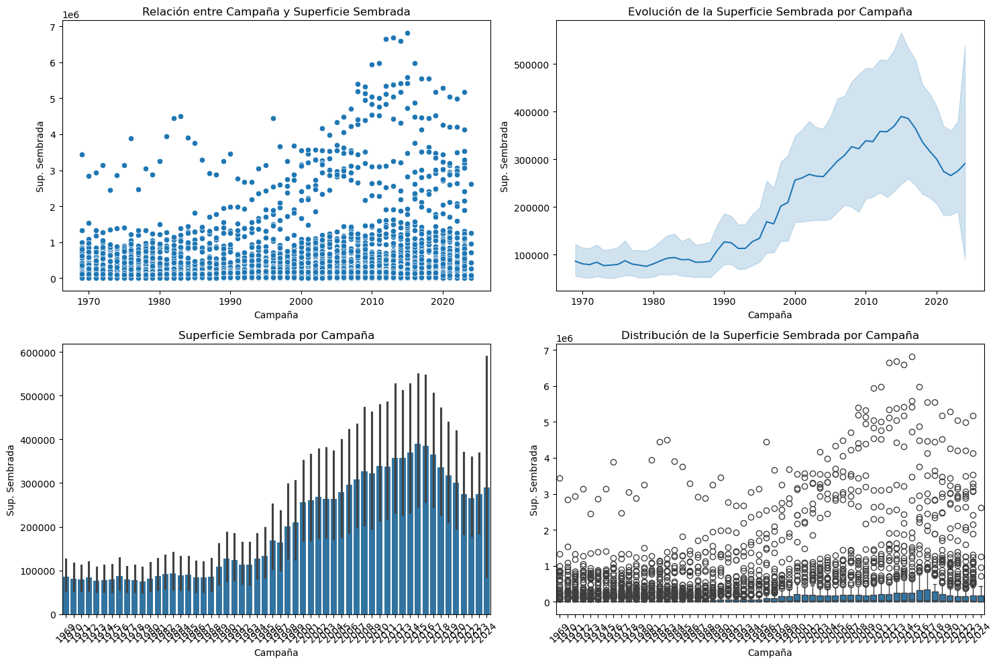

In [49]:
# Graficamos

# Crear una figura con 4 subplots (2 filas, 2 columnas)
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Gráfico de dispersión - Evolución en el tiempo de la Superficie Sembrada
sns.scatterplot(x='Campaña', y='Sup. Sembrada', data=df_estimacion_siembra, ax=axes[0, 0])
axes[0, 0].set_title('Relación entre Campaña y Superficie Sembrada')

# Gráfico de líneas - Evolución en el tiempo de la Superficie Sembrada
sns.lineplot(x='Campaña', y='Sup. Sembrada', data=df_estimacion_siembra, ax=axes[0, 1])
axes[0, 1].set_title('Evolución de la Superficie Sembrada por Campaña')

# Gráfico de barras - Evolución en el tiempo de la Superficie Sembrada
sns.barplot(x='Campaña', y='Sup. Sembrada', data=df_estimacion_siembra, ax=axes[1, 0])
axes[1, 0].set_title('Superficie Sembrada por Campaña')
axes[1, 0].tick_params(axis='x', rotation=45)

# Boxplot - Evolución en el tiempo de la Superficie Sembrada
sns.boxplot(x='Campaña', y='Sup. Sembrada', data=df_estimacion_siembra, ax=axes[1, 1])
axes[1, 1].set_title('Distribución de la Superficie Sembrada por Campaña')
axes[1, 1].tick_params(axis='x', rotation=45)

# Ajustar el espaciado entre los subplots
plt.tight_layout()

# Mostrar la figura
plt.show()

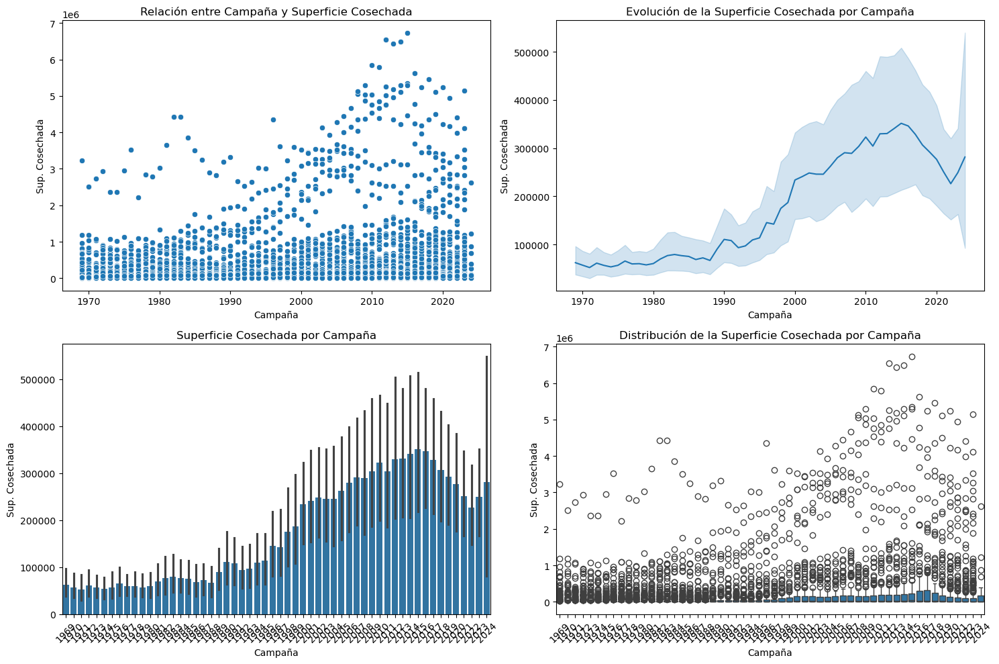

In [50]:
# Crear una figura con 4 subplots (2 filas, 2 columnas)
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Gráfico de dispersión - Evolución en el tiempo de la Superficie Cosechada
sns.scatterplot(x='Campaña', y='Sup. Cosechada', data=df_estimacion_siembra, ax=axes[0, 0])
axes[0, 0].set_title('Relación entre Campaña y Superficie Cosechada')

# Gráfico de líneas - Evolución en el tiempo de la Superficie Cosechada
sns.lineplot(x='Campaña', y='Sup. Cosechada', data=df_estimacion_siembra, ax=axes[0, 1])
axes[0, 1].set_title('Evolución de la Superficie Cosechada por Campaña')

# Gráfico de barras - Evolución en el tiempo de la Superficie Cosechada
sns.barplot(x='Campaña', y='Sup. Cosechada', data=df_estimacion_siembra, ax=axes[1, 0])
axes[1, 0].set_title('Superficie Cosechada por Campaña')
axes[1, 0].tick_params(axis='x', rotation=45)

# Boxplot - Evolución en el tiempo de la Superficie Cosechada
sns.boxplot(x='Campaña', y='Sup. Cosechada', data=df_estimacion_siembra, ax=axes[1, 1])
axes[1, 1].set_title('Distribución de la Superficie Cosechada por Campaña')
axes[1, 1].tick_params(axis='x', rotation=45)

# Ajustar el espaciado entre los subplots
plt.tight_layout()

# Mostrar la figura
plt.show()

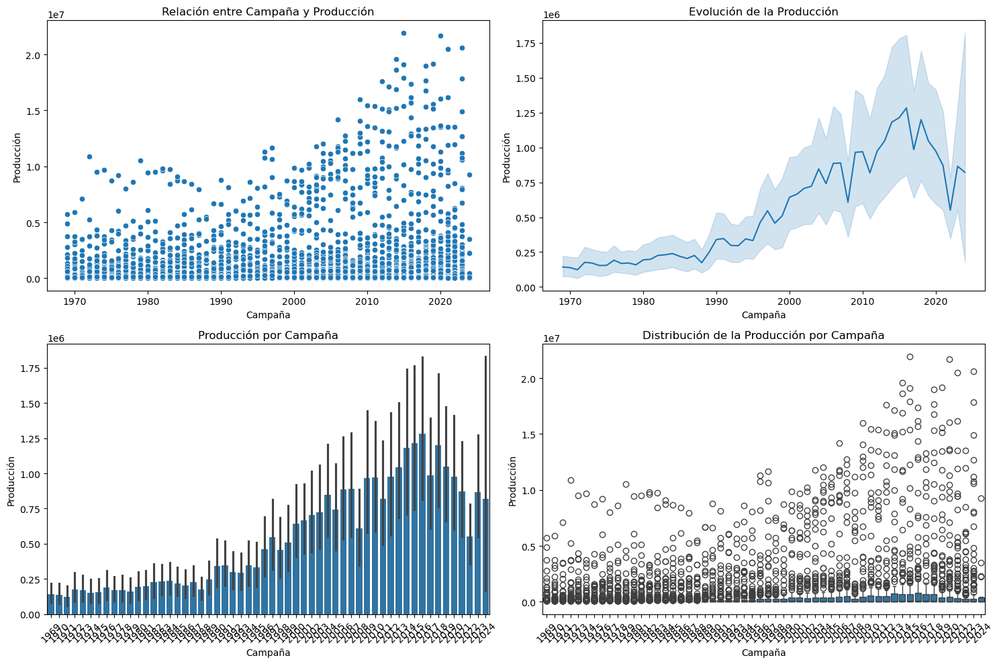

In [53]:
# Crear una figura con 4 subplots (2 filas, 2 columnas)
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Gráfico de dispersión - Evolución en el tiempo de la Producción
sns.scatterplot(x='Campaña', y='Producción', data=df_estimacion_siembra, ax=axes[0, 0])
axes[0, 0].set_title('Relación entre Campaña y Producción')

# Gráfico de líneas - Evolución en el tiempo de la Producción
sns.lineplot(x='Campaña', y='Producción', data=df_estimacion_siembra, ax=axes[0, 1])
axes[0, 1].set_title('Evolución de la Producción')

# Gráfico de barras - Evolución en el tiempo de la Producción
sns.barplot(x='Campaña', y='Producción', data=df_estimacion_siembra, ax=axes[1, 0])
axes[1, 0].set_title('Producción por Campaña')
axes[1, 0].tick_params(axis='x', rotation=45)

# Boxplot - Evolución en el tiempo de la Producción
sns.boxplot(x='Campaña', y='Producción', data=df_estimacion_siembra, ax=axes[1, 1])
axes[1, 1].set_title('Distribución de la Producción por Campaña')
axes[1, 1].tick_params(axis='x', rotation=45)

# Ajustar el espaciado entre los subplots
plt.tight_layout()

# Mostrar la figura
plt.show()

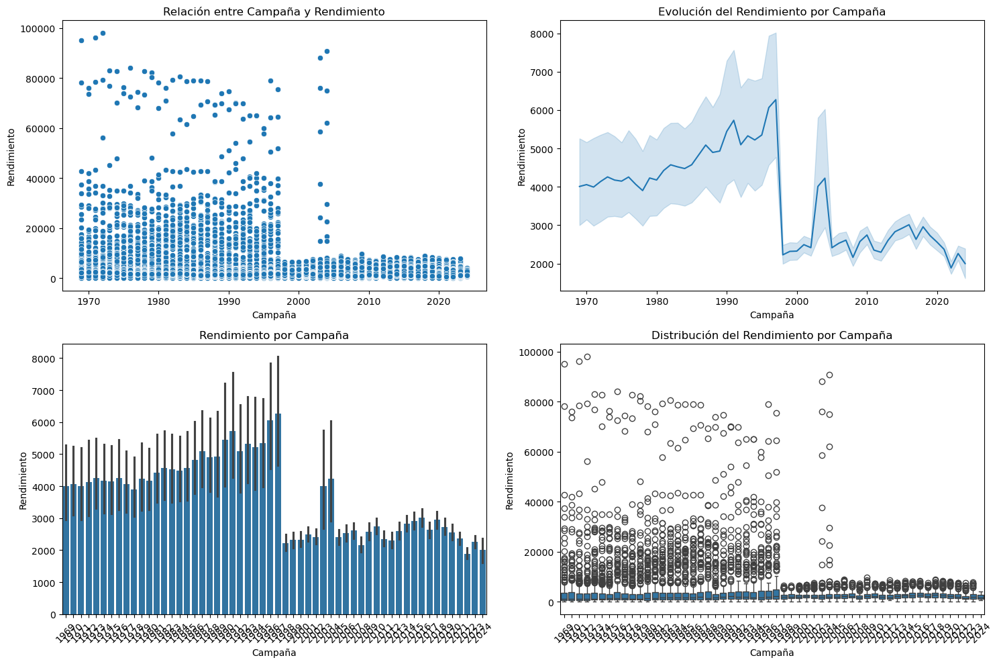

In [55]:
# Crear una figura con 4 subplots (2 filas, 2 columnas)
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Gráfico de dispersión - Evolución en el tiempo del Rendimiento
sns.scatterplot(x='Campaña', y='Rendimiento', data=df_estimacion_siembra, ax=axes[0, 0])
axes[0, 0].set_title('Relación entre Campaña y Rendimiento')

# Gráfico de líneas - Evolución en el tiempo del Rendimiento
sns.lineplot(x='Campaña', y='Rendimiento', data=df_estimacion_siembra, ax=axes[0, 1])
axes[0, 1].set_title('Evolución del Rendimiento por Campaña')

# Gráfico de barras - Evolución en el tiempo del Rendimiento
sns.barplot(x='Campaña', y='Rendimiento', data=df_estimacion_siembra, ax=axes[1, 0])
axes[1, 0].set_title('Rendimiento por Campaña')
axes[1, 0].tick_params(axis='x', rotation=45)

# Boxplot - Evolución en el tiempo del Rendimiento
sns.boxplot(x='Campaña', y='Rendimiento', data=df_estimacion_siembra, ax=axes[1, 1])
axes[1, 1].set_title('Distribución del Rendimiento por Campaña')
axes[1, 1].tick_params(axis='x', rotation=45)

# Ajustar el espaciado entre los subplots
plt.tight_layout()

# Mostrar la figura
plt.show()

Se puede observar un comportamiento anomalo en los registros posteriores a 1996, en esta instancia no podemos saber si es un error en los datos, un cambio en escalas de medicion, o un evento real que se sucedio posterior a esta fecha.

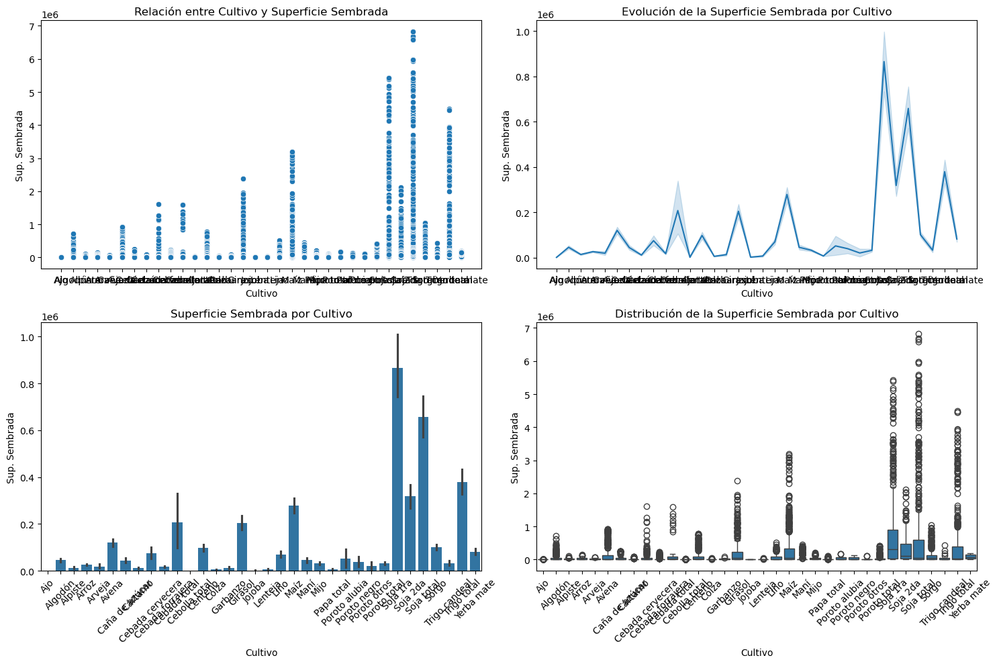

In [58]:
# Crear una figura con 4 subplots (2 filas, 2 columnas)
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Gráfico de dispersión - Relación entre la Superficie Sembrada y cada Cultivo
sns.scatterplot(x='Cultivo', y='Sup. Sembrada', data=df_estimacion_siembra, ax=axes[0, 0])
axes[0, 0].set_title('Relación entre Cultivo y Superficie Sembrada')

# Gráfico de líneas - Relación entre la Superficie Sembrada y cada Cultivo
sns.lineplot(x='Cultivo', y='Sup. Sembrada', data=df_estimacion_siembra, ax=axes[0, 1])
axes[0, 1].set_title('Evolución de la Superficie Sembrada por Cultivo')

# Gráfico de barras - Relación entre la Superficie Sembrada y cada Cultivo
sns.barplot(x='Cultivo', y='Sup. Sembrada', data=df_estimacion_siembra, ax=axes[1, 0])
axes[1, 0].set_title('Superficie Sembrada por Cultivo')
axes[1, 0].tick_params(axis='x', rotation=45)

# Boxplot - Relación entre la Superficie Sembrada y cada Cultivo
sns.boxplot(x='Cultivo', y='Sup. Sembrada', data=df_estimacion_siembra, ax=axes[1, 1])
axes[1, 1].set_title('Distribución de la Superficie Sembrada por Cultivo')
axes[1, 1].tick_params(axis='x', rotation=45)

# Ajustar el espaciado entre los subplots
plt.tight_layout()

# Mostrar la figura
plt.show()

Se ven registros muy dispares entre cada cultivo, incluso es posible ver que dentro del par Provincia/Año hay muchos valores atipicos.

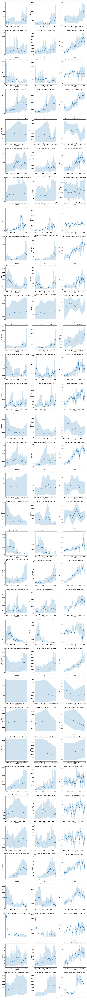

In [61]:
# Vamos a realizar un zoom sobre cada uno de los cultivos para poder ver como fue su evolucion con los años

import math
import matplotlib.pyplot as plt
import seaborn as sns

# Lista de productos cultivados
cultivo = df_estimacion_siembra['Cultivo'].unique().tolist()

# Calcular el número de filas y columnas para la grilla
num_cultivos = len(cultivo)
num_cols = 3  # Número de columnas deseado

# Crear la figura y los subplots
fig, axes = plt.subplots(num_cultivos, num_cols, figsize=(15, 10 * num_cultivos / 2))

# Iterar sobre los productos y crear los gráficos
for i, producto in enumerate(cultivo):
    df_cultivo = df_estimacion_siembra[df_estimacion_siembra['Cultivo'] == producto]

    # Gráfico de líneas - Sup. Sembrada
    sns.lineplot(x='Campaña', y='Sup. Sembrada', data=df_cultivo, ax=axes[i, 0])
    axes[i, 0].set_title(f'Evolución de la Superficie Sembrada de: {producto}')

    # Gráfico de líneas - Producción
    sns.lineplot(x='Campaña', y='Producción', data=df_cultivo, ax=axes[i, 1])
    axes[i, 1].set_title(f'Evolución de la Produccion de: {producto}')

    # Gráfico de líneas - Rendimiento
    sns.lineplot(x='Campaña', y='Rendimiento', data=df_cultivo, ax=axes[i, 2])
    axes[i, 2].set_title(f'Evolución del Rendimiento de: {producto}')

# Ajustar el espaciado entre los subplots
plt.tight_layout()

# Mostrar la figura
plt.show()

En la descripcion del dataset indica que el rendimiento es una funcion tal que rendimiento = produccion/sup. cosechada  lo que se puede interpretar que ante una misma superficie cosechada un decremento en la produccion lleva a una caida en el rendimiento, esto no se ve asi en el caso de los porotos, por lo que genera la duda si es un error en los registros y deberiamos descartar dicha informacion

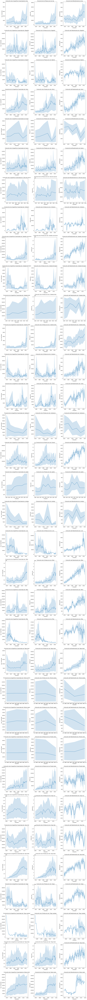

In [64]:

# Lista de productos cultivados
cultivo = df_estimacion_siembra['Cultivo'].unique().tolist()

# Calcular el número de filas y columnas para la grilla
num_cultivos = len(cultivo)
num_cols = 3  # Número de columnas deseado

# Crear la figura y los subplots
fig, axes = plt.subplots(num_cultivos, num_cols, figsize=(15, 10 * num_cultivos / 2))

# Iterar sobre los productos y crear los gráficos
for i, producto in enumerate(cultivo):
    df_cultivo = df_estimacion_siembra[df_estimacion_siembra['Cultivo'] == producto]

    # Gráfico de líneas - Sup. Sembrada
    sns.lineplot(x='Campaña', y='Sup. Cosechada', data=df_cultivo, ax=axes[i, 0])
    axes[i, 0].set_title(f'Evolución de la Superficie Cosechada de: {producto}')

    # Gráfico de líneas - Producción
    sns.lineplot(x='Campaña', y='Producción', data=df_cultivo, ax=axes[i, 1])
    axes[i, 1].set_title(f'Evolución de la Produccion de: {producto}')

    # Gráfico de líneas - Rendimiento
    sns.lineplot(x='Campaña', y='Rendimiento', data=df_cultivo, ax=axes[i, 2])
    axes[i, 2].set_title(f'Evolución del Rendimiento de: {producto}')

# Ajustar el espaciado entre los subplots
plt.tight_layout()

# Mostrar la figura
plt.show()

In [65]:
# Vemos en los graficos valores aplanados, por lo que cruzamos para ver que registros tenemos por cada cosecha para los años

reg_cultivo = []
for cultivo in df_estimacion_siembra['Cultivo'].unique():
    cantidad = df_estimacion_siembra[df_estimacion_siembra['Cultivo'] == cultivo]['Campaña'].unique().shape[0]
    reg_cultivo.append((cultivo,cantidad))
    print(f"Cantidad de registros de {cultivo} : {cantidad}")




Cantidad de registros de Ajo : 29
Cantidad de registros de Algodón : 55
Cantidad de registros de Alpiste : 55
Cantidad de registros de Arroz : 55
Cantidad de registros de Arveja : 6
Cantidad de registros de Avena : 55
Cantidad de registros de Caña de azúcar : 31
Cantidad de registros de Cártamo : 52
Cantidad de registros de Cebada cervecera : 47
Cantidad de registros de Cebada forrajera : 47
Cantidad de registros de Cebada total : 8
Cantidad de registros de Cebolla total : 29
Cantidad de registros de Centeno : 55
Cantidad de registros de Colza : 35
Cantidad de registros de Garbanzo : 6
Cantidad de registros de Girasol : 55
Cantidad de registros de Jojoba : 9
Cantidad de registros de Lenteja : 6
Cantidad de registros de Lino : 55
Cantidad de registros de Maíz : 55
Cantidad de registros de Maní : 55
Cantidad de registros de Mijo : 55
Cantidad de registros de Papa total : 29
Cantidad de registros de Poroto alubia : 3
Cantidad de registros de Poroto negro : 3
Cantidad de registros de Porot

Hay numerosos productos que tienen solo un par de años de registro, lo que volveria mas impredecible su analisis

In [69]:
# Ordenamos los cultivos segun la cantidad de registros
reg_cultivo.sort(key=lambda x: x[1])

reg_cultivo


[('Poroto alubia', 3),
 ('Poroto negro', 3),
 ('Poroto otros', 3),
 ('Arveja', 6),
 ('Garbanzo', 6),
 ('Lenteja', 6),
 ('Cebada total', 8),
 ('Jojoba', 9),
 ('Soja 1ra', 24),
 ('Soja 2da', 24),
 ('Ajo', 29),
 ('Cebolla total', 29),
 ('Papa total', 29),
 ('Caña de azúcar', 31),
 ('Colza', 35),
 ('Cebada cervecera', 47),
 ('Cebada forrajera', 47),
 ('Trigo candeal', 49),
 ('Yerba mate', 51),
 ('Cártamo', 52),
 ('Algodón', 55),
 ('Alpiste', 55),
 ('Arroz', 55),
 ('Avena', 55),
 ('Centeno', 55),
 ('Girasol', 55),
 ('Lino', 55),
 ('Maíz', 55),
 ('Maní', 55),
 ('Mijo', 55),
 ('Poroto total', 55),
 ('Soja total', 55),
 ('Sorgo', 55),
 ('Trigo total', 56)]

In [71]:
 df_estimacion_siembra[df_estimacion_siembra['Cultivo'] == 'Poroto alubia'][['Campaña','Provincia']]


,Campaña,Provincia
8816,2021,CORDOBA
8817,2022,CORDOBA
8818,2023,CORDOBA
8819,2021,JUJUY
8820,2022,JUJUY
8821,2023,JUJUY
8822,2021,SALTA
8823,2022,SALTA
8824,2023,SALTA
8825,2021,TUCUMAN


In [73]:
df_estimacion_siembra[df_estimacion_siembra['Cultivo'] == 'Lenteja'][['Campaña','Provincia']]

,Campaña,Provincia
5318,2018,BUENOS AIRES
5319,2019,BUENOS AIRES
5320,2020,BUENOS AIRES
5321,2021,BUENOS AIRES
5322,2022,BUENOS AIRES
5323,2023,BUENOS AIRES
5324,2019,CORDOBA
5325,2020,CORDOBA
5326,2021,CORDOBA
5327,2022,CORDOBA


Vemos que es muy dispar los registros de algunos productos

In [76]:
productos_eliminar = ['Poroto alubia','Poroto negro','Poroto otros','Arveja','Garbanzo','Lenteja','Cebada total','Jojoba']

In [78]:
df_estimacion_siembra = df_estimacion_siembra[~df_estimacion_siembra['Cultivo'].isin(productos_eliminar)]


In [80]:
df_estimacion_siembra[df_estimacion_siembra['Cultivo'] == 'Soja 1ra']['Campaña'].unique()

array([2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010,
       2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021,
       2022, 2023])

In [82]:
df_estimacion_siembra[df_estimacion_siembra['Cultivo'] == 'Soja 2da']['Campaña'].unique()

array([2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010,
       2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021,
       2022, 2023])

In [84]:
df_estimacion_siembra[(df_estimacion_siembra['Cultivo'] == 'Soja total') & (df_estimacion_siembra['Campaña'] == 2002)]

,Cultivo,Campaña,Provincia,Sup. Sembrada,Sup. Cosechada,Producción,Rendimiento
9994,Soja total,2002,BUENOS AIRES,2475653,2450723,7142260,2914
10043,Soja total,2002,CATAMARCA,40000,40000,112000,2800
10098,Soja total,2002,CHACO,751400,729100,1572570,2157
10151,Soja total,2002,CORDOBA,3564351,3543401,9851101,2780
10205,Soja total,2002,CORRIENTES,9760,9235,18620,2016
10256,Soja total,2002,ENTRE RIOS,1055000,1047400,2809000,2682
10310,Soja total,2002,FORMOSA,8530,7810,15100,1933
10354,Soja total,2002,JUJUY,1000,1000,1950,1950
10399,Soja total,2002,LA PAMPA,103350,95600,206000,2155
10455,Soja total,2002,MISIONES,2200,625,1420,2272


In [86]:
df_estimacion_siembra[(df_estimacion_siembra['Cultivo'] == 'Soja 1ra') & (df_estimacion_siembra['Campaña'] == 2002)]

,Cultivo,Campaña,Provincia,Sup. Sembrada,Sup. Cosechada,Producción,Rendimiento
9320,Soja 1ra,2002,BUENOS AIRES,1848396,1828316,5589530,3057
9343,Soja 1ra,2002,CATAMARCA,32000,32000,89600,2800
9367,Soja 1ra,2002,CHACO,611012,591964,1277462,2158
9391,Soja 1ra,2002,CORDOBA,2726921,2711471,7706801,2842
9415,Soja 1ra,2002,CORRIENTES,9760,9235,18620,2016
9439,Soja 1ra,2002,ENTRE RIOS,764000,761900,2123000,2786
9463,Soja 1ra,2002,FORMOSA,8530,7810,15100,1933
9486,Soja 1ra,2002,JUJUY,1000,1000,1950,1950
9510,Soja 1ra,2002,LA PAMPA,93800,86600,194000,2240
9534,Soja 1ra,2002,MISIONES,2200,625,1420,2272


In [88]:
df_estimacion_siembra[(df_estimacion_siembra['Cultivo'] == 'Soja 2da') & (df_estimacion_siembra['Campaña'] == 2002)]

,Cultivo,Campaña,Provincia,Sup. Sembrada,Sup. Cosechada,Producción,Rendimiento
9678,Soja 2da,2002,BUENOS AIRES,627257,622407,1552730,2495
9701,Soja 2da,2002,CATAMARCA,8000,8000,22400,2800
9725,Soja 2da,2002,CHACO,140388,137136,295108,2152
9749,Soja 2da,2002,CORDOBA,837430,831930,2144300,2578
9778,Soja 2da,2002,ENTRE RIOS,291000,285500,686000,2403
9833,Soja 2da,2002,LA PAMPA,9550,9000,12000,1333
9857,Soja 2da,2002,SALTA,99750,92905,242628,2612
9895,Soja 2da,2002,SANTA FE,742000,735000,2042450,2779
9940,Soja 2da,2002,TUCUMAN,99750,98599,218683,2218


In [90]:
provincias_soja_2002 = df_estimacion_siembra[(df_estimacion_siembra['Cultivo'] == 'Soja 2da') & (df_estimacion_siembra['Campaña'] == 2002)]['Provincia']

In [92]:
int(df_estimacion_siembra[(df_estimacion_siembra['Cultivo'] == 'Soja 2da') & (df_estimacion_siembra['Campaña'] == 2002) & (df_estimacion_siembra['Provincia'] == 'BUENOS AIRES')]['Producción'])+int(df_estimacion_siembra[(df_estimacion_siembra['Cultivo'] == 'Soja 1ra') & (df_estimacion_siembra['Campaña'] == 2002) & (df_estimacion_siembra['Provincia'] == 'BUENOS AIRES')]['Producción'])

/tmp/ipykernel_965189/55718.py:1: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  int(df_estimacion_siembra[(df_estimacion_siembra['Cultivo'] == 'Soja 2da') & (df_estimacion_siembra['Campaña'] == 2002) & (df_estimacion_siembra['Provincia'] == 'BUENOS AIRES')]['Producción'])+int(df_estimacion_siembra[(df_estimacion_siembra['Cultivo'] == 'Soja 1ra') & (df_estimacion_siembra['Campaña'] == 2002) & (df_estimacion_siembra['Provincia'] == 'BUENOS AIRES')]['Producción'])


7142260

In [94]:

filtered_df = df_estimacion_siembra[
    ((df_estimacion_siembra['Cultivo'] == 'Soja 1ra') | (df_estimacion_siembra['Cultivo'] == 'Soja 2da'))  &
    (df_estimacion_siembra['Provincia'].isin(provincias_soja_2002)) &  (df_estimacion_siembra['Campaña'] == 2002)
]

# Agrupamos por provincia y sumamos la producción
grouped_df = filtered_df.groupby('Provincia')['Producción'].sum()

# Mostramos el resultado
grouped_df

Provincia
BUENOS AIRES     7142260
CATAMARCA         112000
CHACO            1572570
CORDOBA          9851101
ENTRE RIOS       2809000
LA PAMPA          206000
SALTA             743000
SANTA FE        10223500
TUCUMAN           570000
Name: Producción, dtype: int64

In [96]:
df_estimacion_siembra[(df_estimacion_siembra['Cultivo'] == 'Soja total') & (df_estimacion_siembra['Campaña'] == 2002) & (df_estimacion_siembra['Provincia'].isin(provincias_soja_2002))]

,Cultivo,Campaña,Provincia,Sup. Sembrada,Sup. Cosechada,Producción,Rendimiento
9994,Soja total,2002,BUENOS AIRES,2475653,2450723,7142260,2914
10043,Soja total,2002,CATAMARCA,40000,40000,112000,2800
10098,Soja total,2002,CHACO,751400,729100,1572570,2157
10151,Soja total,2002,CORDOBA,3564351,3543401,9851101,2780
10256,Soja total,2002,ENTRE RIOS,1055000,1047400,2809000,2682
10399,Soja total,2002,LA PAMPA,103350,95600,206000,2155
10510,Soja total,2002,SALTA,320500,289500,743000,2566
10601,Soja total,2002,SANTA FE,3319000,3260000,10223500,3136
10707,Soja total,2002,TUCUMAN,260000,257000,570000,2218


Podemos confirmar que (por lo menos para una campaña testigo 2002) Soja 1era y Soja 2da componen a Soja Total. Dado a que todos los otros productos van a estar analizados en un año de campaña, vamos a tomar la producción de soja por su totalidad para simplificar los analisis de las otras variables que sumemos a futuro

In [99]:
df_estimacion_siembra = df_estimacion_siembra[(df_estimacion_siembra['Cultivo'] != 'Soja 1ra')]
df_estimacion_siembra = df_estimacion_siembra[(df_estimacion_siembra['Cultivo'] != 'Soja 2da')]
df_estimacion_siembra.info()

<class 'pandas.core.frame.DataFrame'>
Index: 10264 entries, 0 to 12687
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Cultivo         10264 non-null  object
 1   Campaña         10264 non-null  int64 
 2   Provincia       10264 non-null  object
 3   Sup. Sembrada   10264 non-null  int64 
 4   Sup. Cosechada  10264 non-null  int64 
 5   Producción      10264 non-null  int64 
 6   Rendimiento     10264 non-null  int64 
dtypes: int64(5), object(2)
memory usage: 641.5+ KB


In [101]:
# Vemos que la cantidad de registros antes del 1990 era el doble
df_estimacion_siembra.groupby('Campaña')['Producción'].count()


Campaña
1969    259
1970    258
1971    258
1972    263
1973    266
1974    262
1975    263
1976    267
1977    273
1978    284
1979    285
1980    279
1981    263
1982    262
1983    260
1984    258
1985    253
1986    243
1987    244
1988    235
1989    201
1990    164
1991    164
1992    181
1993    186
1994    180
1995    178
1996    163
1997    164
1998    134
1999    127
2000    125
2001    126
2002    125
2003    138
2004    140
2005    132
2006    133
2007    133
2008    128
2009    129
2010    132
2011    134
2012    131
2013    131
2014    130
2015    126
2016    116
2017    120
2018    122
2019    129
2020    140
2021    146
2022    149
2023    149
2024     23
Name: Producción, dtype: int64

In [103]:
df_estimacion_siembra[df_estimacion_siembra['Campaña']==1988]['Producción'].count()

235

In [105]:
df_estimacion_siembra[df_estimacion_siembra['Campaña']==2005]['Producción'].count()

132

In [107]:
df_1985_1989 = df_estimacion_siembra[(df_estimacion_siembra['Campaña'] >= 1985) & (df_estimacion_siembra['Campaña'] <= 1989)]
df_2005_2009 = df_estimacion_siembra[(df_estimacion_siembra['Campaña'] >= 2005) & (df_estimacion_siembra['Campaña'] <= 2009)]

# Obtener los cultivos con registros entre 1985 y 1989
cultivos_1985_1989 = df_1985_1989['Cultivo'].unique()

# Obtener los cultivos con registros entre 2005 y 2009
cultivos_2005_2009 = df_2005_2009['Cultivo'].unique()

# Filtrar los cultivos que están en el primer rango pero no en el segundo
cultivos_filtrados = [cultivo for cultivo in cultivos_1985_1989 if cultivo not in cultivos_2005_2009]

# Contar la cantidad de registros para cada cultivo filtrado en el primer rango
conteo_cultivos = df_1985_1989[df_1985_1989['Cultivo'].isin(cultivos_filtrados)]['Cultivo'].value_counts()

# Obtener el top 6 de cultivos
top_cultivos = conteo_cultivos.head()

# Mostrar el resultado
print(top_cultivos)

Cultivo
Cebolla total     92
Papa total        87
Ajo               77
Caña de azúcar    38
Name: count, dtype: int64


In [109]:
df_estimacion_siembra = df_estimacion_siembra[df_estimacion_siembra['Cultivo']!='Cebolla total']
df_estimacion_siembra = df_estimacion_siembra[df_estimacion_siembra['Cultivo']!='Papa total']
df_estimacion_siembra = df_estimacion_siembra[df_estimacion_siembra['Cultivo']!='Ajo']
df_estimacion_siembra = df_estimacion_siembra[df_estimacion_siembra['Cultivo']!='Caña de azúcar']

In [111]:
df_estimacion_siembra.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8540 entries, 476 to 12687
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Cultivo         8540 non-null   object
 1   Campaña         8540 non-null   int64 
 2   Provincia       8540 non-null   object
 3   Sup. Sembrada   8540 non-null   int64 
 4   Sup. Cosechada  8540 non-null   int64 
 5   Producción      8540 non-null   int64 
 6   Rendimiento     8540 non-null   int64 
dtypes: int64(5), object(2)
memory usage: 533.8+ KB


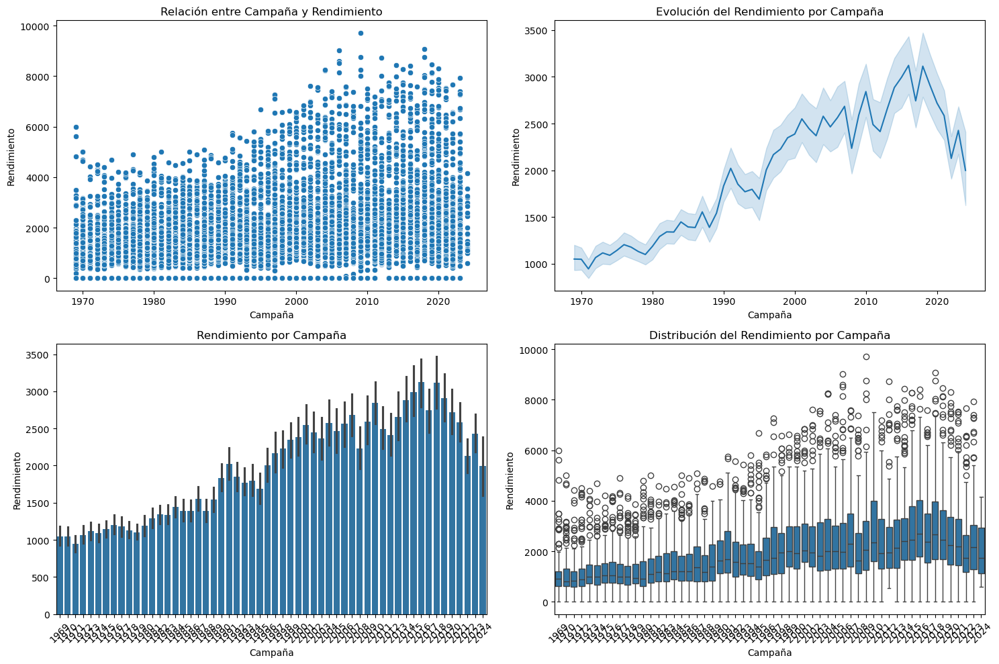

In [113]:
# Crear una figura con 4 subplots (2 filas, 2 columnas)
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Gráfico de dispersión - Evolución en el tiempo del Rendimiento
sns.scatterplot(x='Campaña', y='Rendimiento', data=df_estimacion_siembra, ax=axes[0, 0])
axes[0, 0].set_title('Relación entre Campaña y Rendimiento')

# Gráfico de líneas - Evolución en el tiempo del Rendimiento
sns.lineplot(x='Campaña', y='Rendimiento', data=df_estimacion_siembra, ax=axes[0, 1])
axes[0, 1].set_title('Evolución del Rendimiento por Campaña')

# Gráfico de barras - Evolución en el tiempo del Rendimiento
sns.barplot(x='Campaña', y='Rendimiento', data=df_estimacion_siembra, ax=axes[1, 0])
axes[1, 0].set_title('Rendimiento por Campaña')
axes[1, 0].tick_params(axis='x', rotation=45)

# Boxplot - Evolución en el tiempo del Rendimiento
sns.boxplot(x='Campaña', y='Rendimiento', data=df_estimacion_siembra, ax=axes[1, 1])
axes[1, 1].set_title('Distribución del Rendimiento por Campaña')
axes[1, 1].tick_params(axis='x', rotation=45)

# Ajustar el espaciado entre los subplots
plt.tight_layout()

# Mostrar la figura
plt.show()

Con los cambios que hicimos en el dataset se pudo normalizar las graficas.
Seguimos teniendo productos que tienen registros hasta el 2020 unicamente , esto provoca una caida en los registros que eventualmente podriamos pensar que es un error de medición, pero no podemos saber en esta instancia si no responde a algun otro factor que modifico la logica de negocio como por ejemplo la cuarentena por COVID 19

In [117]:
# Filtrar el dataframe para los rangos de años especificados
df_1985_2019 = df_estimacion_siembra[(df_estimacion_siembra['Campaña'] >= 1985) & (df_estimacion_siembra['Campaña'] <= 2019)]
df_2020_2022 = df_estimacion_siembra[(df_estimacion_siembra['Campaña'] >= 2020) & (df_estimacion_siembra['Campaña'] <= 2022)]


cultivos_1985_2019 = df_1985_2019['Cultivo'].unique()

# Obtener los cultivos con registros entre 2005 y 2009
cultivos_2020_2022 = df_2020_2022['Cultivo'].unique()

# Filtrar los cultivos que están en el primer rango pero no en el segundo
cultivos_filtrados = [cultivo for cultivo in cultivos_1985_2019 if cultivo not in cultivos_2020_2022]

# Contar la cantidad de registros para cada cultivo filtrado en el primer rango
conteo_cultivos = df_1985_2019[df_1985_2019['Cultivo'].isin(cultivos_filtrados)]['Cultivo'].value_counts()

# Obtener el top 6 de cultivos
top_6_cultivos = conteo_cultivos.head(6)

# Mostrar el resultado
print(top_6_cultivos)

Cultivo
Cebada forrajera    185
Cebada cervecera    146
Yerba mate           70
Name: count, dtype: int64


In [119]:
df_estimacion_siembra[df_estimacion_siembra['Cultivo']=='Cebada cervecera']['Campaña'].max()

2015

In [121]:
df_estimacion_siembra[df_estimacion_siembra['Cultivo']=='Yerba mate']['Campaña'].max()

2019

In [123]:
df_estimacion_siembra[df_estimacion_siembra['Cultivo']=='Cebada forrajera']['Campaña'].max()

2015

In [125]:
df_estimacion_siembra[df_estimacion_siembra['Cultivo']=='Yerba mate'].groupby('Campaña')['Producción'].sum()

Campaña
1969     76788
1970     90460
1971    126714
1972    150963
1973    134529
1974    142308
1975    121135
1976    127167
1977    133436
1978    135200
1979    134813
1980    139745
1981    161371
1982    136210
1983    181625
1984    154469
1985    155740
1986    131995
1987    137401
1988    144838
1989    155830
1990    160761
1991    172455
1992    221321
1993    240414
1994    260718
1995    269970
1996    281573
1997    286770
1998    703448
1999    670399
2000    684597
2001    695400
2002    775591
2003    749200
2004    782801
2005    787900
2006    816600
2007    730190
2008    741686
2009    804458
2010    775600
2011    718190
2012    692770
2013    849825
2014    809100
2015    806936
2016    690100
2017    809302
2018    837054
2019    813454
Name: Producción, dtype: int64

Datos obtenidos por fuente de datos del Instituto Nacional de la Yerba Mate en Argentina, se verifica que los registros de dicha base para la producción 2019 es de 837.256.020 Kg, mientras que los registros que obtuvimos en la actual base de datos es de 813.454.000 kg, esto implica un margen de error del 3% , aprovechamos estos registros para poder completar los registros faltantes donde el TOTAL es:

2020 812.995.722

2021 882.095.968

2022 829.237.261

2023 774.167.269

2024 986.737.613



In [129]:
# Evaluamos el volumen de la produccion que corresponde a cada provincia

# Filtrar los DataFrames para 'Yerba mate' en 'CORRIENTES' y 'MISIONES'
corrientes_df = df_estimacion_siembra[
    (df_estimacion_siembra['Cultivo'] == 'Yerba mate') &
    (df_estimacion_siembra['Provincia'] == 'CORRIENTES')
]

misiones_df = df_estimacion_siembra[
    (df_estimacion_siembra['Cultivo'] == 'Yerba mate') &
    (df_estimacion_siembra['Provincia'] == 'MISIONES')
]

# Reiniciar los índices de ambos DataFrames
corrientes_df = corrientes_df.reset_index(drop=True)
misiones_df = misiones_df.reset_index(drop=True)

# Calcular el coeficiente para cada registro
coeficientes = corrientes_df['Producción'] / misiones_df['Producción']

# Mostrar los coeficientes
coeficientes.mean()
# Obtenemos el valor para cada registro
produccion_misiones = [(2020,812995*0.861),(2021,882095*0.861),(2022,829237*0.861),(2023,774167*0.861),(2024,986737*0.861)]
produccion_corrientes = [(2020,812995*0.139),(2021,882095*0.139),(2022,829237*0.139),(2023,774167*0.139),(2024,986737*0.139)]


In [131]:
from sklearn.linear_model import LinearRegression
import numpy as np


# Generamos registros artificiales para el cultivo Yerba mate entre 2020 y 2024
# Partimos de la información descargada en otro set de datos
# Obtenemos la proporción de la producción correspondiente a Misiones/Corrientes
# Generamos una regresion lineal multiple tomando la campaña y la producción para obtener el valor de superficie sembrada
# Consideramos que la superficie sembrada y la cosechada es practicamente la misma siempre

# Filtrar el DataFrame
filtered_df = df_estimacion_siembra[
    (df_estimacion_siembra['Cultivo'] == 'Yerba mate') &
    (df_estimacion_siembra['Provincia'] == 'CORRIENTES')
]

# Crear las variables X e y
X = filtered_df[['Campaña', 'Producción']].values  # Variables independientes: Campaña y Producción
y = filtered_df['Sup. Sembrada'].values  # Variable dependiente: Sup. Sembrada

# Crear y entrenar el modelo de regresión lineal
model_siembra = LinearRegression()
model_siembra.fit(X, y)

yerba_corrientes = []
for i in produccion_corrientes:
    siembra = model_siembra.predict(np.array([i]))[0]


    # Crea un diccionario con los datos de la predicción
    prediction_data = {
        'Cultivo': 'Yerba mate',
        'Campaña': i[0],
        'Provincia': 'CORRIENTES',
        'Sup. Sembrada': siembra,
        'Sup. Cosechada': siembra,
        'Producción': i[1],
        'Rendimiento': i[1]*1000/siembra
    }
    # Agrega el diccionario a la lista
    yerba_corrientes.append(prediction_data)

# Crea un DataFrame a partir de la lista de diccionarios
df_yerba_corrientes = pd.DataFrame(yerba_corrientes)



In [133]:
# Filtrar el DataFrame
filtered_df = df_estimacion_siembra[
    (df_estimacion_siembra['Cultivo'] == 'Yerba mate') &
    (df_estimacion_siembra['Provincia'] == 'MISIONES')
]

# Crear las variables X e y
X = filtered_df[['Campaña', 'Producción']].values  # Variables independientes: Campaña y Producción
y = filtered_df['Sup. Sembrada'].values  # Variable dependiente: Sup. Sembrada

# Crear y entrenar el modelo de regresión lineal
model_siembra = LinearRegression()
model_siembra.fit(X, y)

yerba_misiones = []
for i in produccion_misiones:
    siembra = model_siembra.predict(np.array([i]))[0]


    # Crea un diccionario con los datos de la predicción
    prediction_data = {
        'Cultivo': 'Yerba mate',
        'Campaña': i[0],
        'Provincia': 'MISIONES',
        'Sup. Sembrada': siembra,
        'Sup. Cosechada': siembra,
        'Producción': i[1],
        'Rendimiento': i[1]*1000/siembra
    }
    # Agrega el diccionario a la lista
    yerba_misiones.append(prediction_data)

# Crea un DataFrame a partir de la lista de diccionarios
df_yerba_misiones = pd.DataFrame(yerba_misiones)



In [135]:
# Convertimos todos los valores en enteros
df_yerba_misiones['Sup. Cosechada'] = df_yerba_misiones['Sup. Cosechada'].astype(int)
df_yerba_misiones['Sup. Sembrada'] = df_yerba_misiones['Sup. Sembrada'].astype(int)
df_yerba_misiones['Producción'] = df_yerba_misiones['Producción'].astype(int)
df_yerba_misiones['Rendimiento'] = df_yerba_misiones['Rendimiento'].astype(int)

df_yerba_corrientes['Sup. Cosechada'] = df_yerba_corrientes['Sup. Cosechada'].astype(int)
df_yerba_corrientes['Sup. Sembrada'] = df_yerba_corrientes['Sup. Sembrada'].astype(int)
df_yerba_corrientes['Producción'] = df_yerba_corrientes['Producción'].astype(int)
df_yerba_corrientes['Rendimiento'] = df_yerba_corrientes['Rendimiento'].astype(int)

In [137]:
# Agregamos los nuevos registros generados artificialmente
df_estimacion_siembra = pd.concat([df_estimacion_siembra, df_yerba_misiones, df_yerba_corrientes], ignore_index=True)


In [139]:
# Verificamos como quedan los registros
df_estimacion_siembra[(df_estimacion_siembra['Cultivo']=='Yerba mate') & (df_estimacion_siembra['Campaña']>2000)]

,Cultivo,Campaña,Provincia,Sup. Sembrada,Sup. Cosechada,Producción,Rendimiento
8470,Yerba mate,2001,CORRIENTES,16365,15401,105475,6849
8471,Yerba mate,2002,CORRIENTES,16500,15400,107460,6978
8472,Yerba mate,2003,CORRIENTES,17000,15500,95200,6142
8473,Yerba mate,2004,CORRIENTES,17500,16100,101320,6293
8474,Yerba mate,2005,CORRIENTES,17900,15900,94900,5969
8475,Yerba mate,2006,CORRIENTES,18200,16450,112074,6813
8476,Yerba mate,2007,CORRIENTES,18500,16550,107650,6505
8477,Yerba mate,2008,CORRIENTES,18600,16750,96675,5772
8478,Yerba mate,2009,CORRIENTES,18700,17000,115750,6809
8479,Yerba mate,2010,CORRIENTES,18800,17000,108720,6395


In [141]:
df_estimacion_siembra[(df_estimacion_siembra['Cultivo']=='Cebada cervecera') & (df_estimacion_siembra['Campaña']==2015)][['Provincia','Sup. Sembrada']]

,Provincia,Sup. Sembrada
1937,BUENOS AIRES,1272466
1988,CORDOBA,56590
1998,ENTRE RIOS,4800
2045,LA PAMPA,103980
2134,SANTA FE,29585


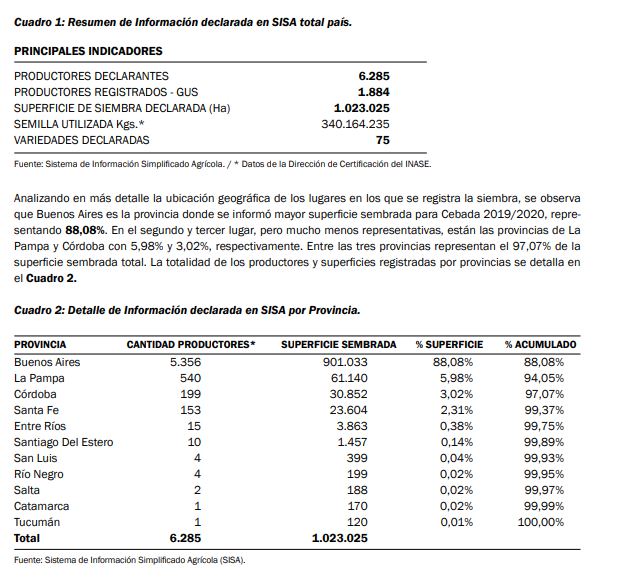

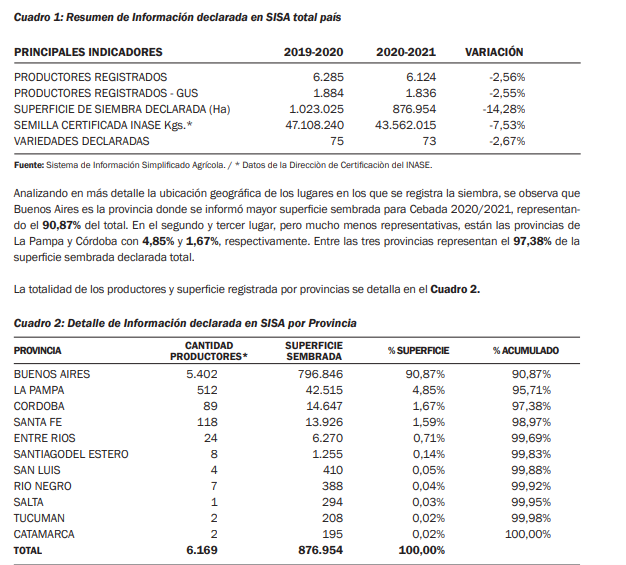

image.png

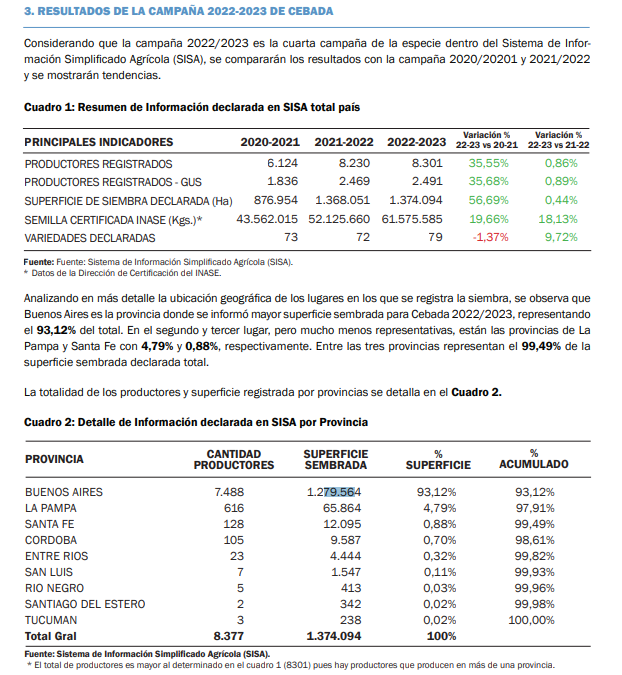

SIEMBRA

2019 1.023.000

2020 877.000

2021 1.361.000

2022 1.374.000

2023

Encontramos una grafica con valores que no citan la fuente, los que podemos cruzar tienen una tendencia similar por lo cual si bien hay una diferencia entre lo que podemos interpretar en el grafico y lo que obtenemos en registros oficiales, el margen de error es aceptable para poder reducir la incertidumbre y generar los datos faltantes

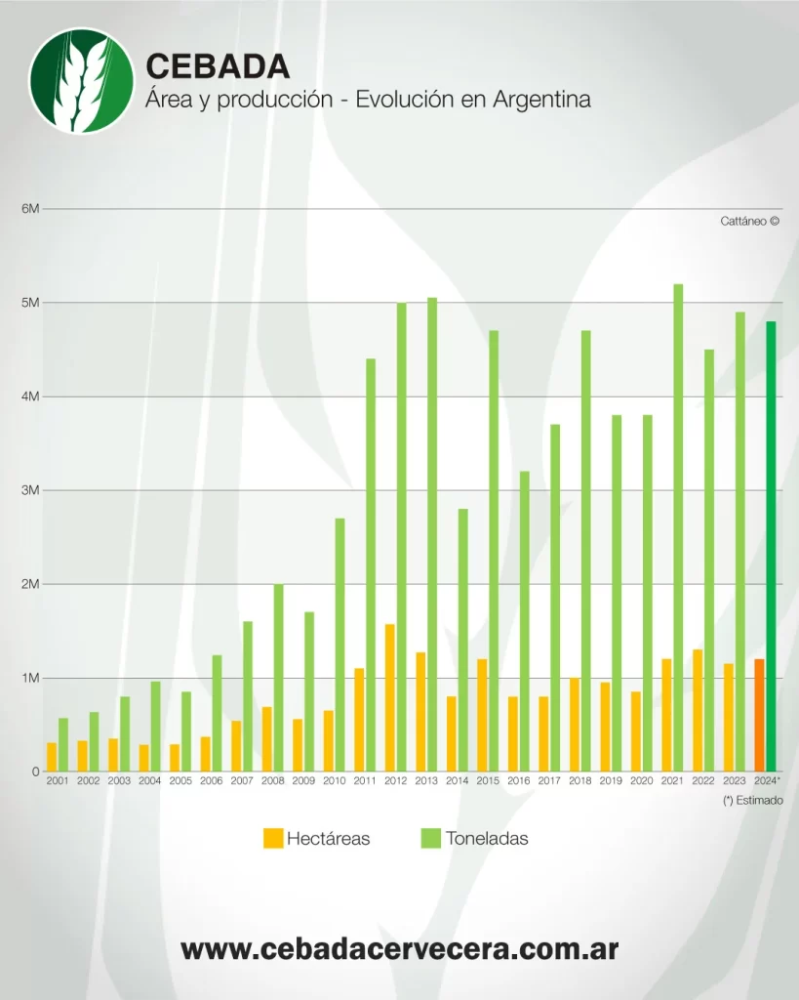

Partiendo de los valores oficiales realizamos algunas correcciones en los valores que podemos visualizar en el grafico y podemos obtener la siguiente serie:

2016
Siembra:  Valor similar a los registrados en 2014 (se buscara en el dataset)
Producción: 3.15m

2017
Siembra:  Valor similar a los registrados en 2014 (se buscara en el dataset)
Producción: 3,75

2018
Siembra: 1m
Producción:  Valor similar a los registrados en 2015 (se buscara en el dataset)

2019
Siembra: 1.02
Producción: 3.9

2020
Siembra: 877.000
Producción: 3.8

2021
Siembra:1.36
Producción: 5.15

2022
Siembra: 1.374
Producción:4.55

2023
Siembra: 1.28
Producción:4.95

In [150]:
print(f"Siembra 2014 {df_estimacion_siembra[(df_estimacion_siembra['Cultivo']=='Cebada cervecera') & (df_estimacion_siembra['Campaña']==2014)]['Sup. Sembrada'].sum() }")
print(f"Producción 2015 {df_estimacion_siembra[(df_estimacion_siembra['Cultivo']=='Cebada cervecera') & (df_estimacion_siembra['Campaña']==2014)]['Producción'].sum() }")

Siembra 2014 1006118
Producción 2015 2901495


In [152]:
total_cebada_sembrado = [(2016,1006118),(2017,1006118),(2018,1000000),(2019,1020000),(2020,877000),(2021,1360000),(2022,1374000),(2023,1280000)]
total_cebada_producido = [(2016,3150000),(2017,3700000),(2018,2901495),(2019,3900000),(2020,3800000),(2021,5150000),(2022,4550000),(2023,4950000)]

In [154]:
# Total de la Cebada Cervecera sembrada desde 2010

total_sembrado = df_estimacion_siembra[(df_estimacion_siembra['Cultivo']=='Cebada cervecera') & (df_estimacion_siembra['Campaña']>2010)]['Sup. Sembrada'].sum()
total_producido = df_estimacion_siembra[(df_estimacion_siembra['Cultivo']=='Cebada cervecera') & (df_estimacion_siembra['Campaña']>2010)]['Producción'].sum()

# Provincias que tuvieron registros de siembra de Cebada Cervecera los periodos anteriores al 2015 - % de Incidencia
siembra_porcentual = df_estimacion_siembra[(df_estimacion_siembra['Cultivo']=='Cebada cervecera') & (df_estimacion_siembra['Campaña']>2010)].groupby('Provincia')['Sup. Sembrada'].sum().sort_values(ascending=False)/total_sembrado

produccion_porcentual = df_estimacion_siembra[(df_estimacion_siembra['Cultivo']=='Cebada cervecera') & (df_estimacion_siembra['Campaña']>2010)].groupby('Provincia')['Producción'].sum().sort_values(ascending=False)/total_producido

In [156]:
siembra_porcentual

Provincia
BUENOS AIRES           0.895585
LA PAMPA               0.039087
SANTA FE               0.029501
CORDOBA                0.024911
ENTRE RIOS             0.009305
SANTIAGO DEL ESTERO    0.001592
SAN LUIS               0.000018
Name: Sup. Sembrada, dtype: float64

In [158]:
produccion_porcentual

Provincia
BUENOS AIRES           0.935970
LA PAMPA               0.025966
SANTA FE               0.022245
CORDOBA                0.009942
ENTRE RIOS             0.005559
SANTIAGO DEL ESTERO    0.000303
SAN LUIS               0.000015
Name: Producción, dtype: float64

In [160]:
cebada_bsas = []
for i in range(len(total_cebada_sembrado)):
  registro_nuevos = {
        'Cultivo': 'Cebada cervecera',
        'Campaña': total_cebada_producido[i][0],
        'Provincia': 'BUENOS AIRES',
        'Sup. Sembrada': int(total_cebada_sembrado[i][1]*0.8955),
        'Sup. Cosechada': int(total_cebada_sembrado[i][1]*0.8955),
        'Producción': int(total_cebada_producido[i][1]*0.9359),
        'Rendimiento': int((total_cebada_producido[i][1]*0.9359)*1000/total_cebada_sembrado[i][1]*0.8955)
    }
    # Agrega el diccionario a la lista
  cebada_bsas.append(registro_nuevos)

# Crea un DataFrame a partir de la lista de diccionarios
df_cebada_bsas = pd.DataFrame(cebada_bsas)


cebada_lapampa = []
for i in range(len(total_cebada_sembrado)):
  registro_nuevos = {
        'Cultivo': 'Cebada cervecera',
        'Campaña': total_cebada_producido[i][0],
        'Provincia': 'LA PAMPA',
        'Sup. Sembrada': int(total_cebada_sembrado[i][1]*0.04),
        'Sup. Cosechada': int(total_cebada_sembrado[i][1]*0.04),
        'Producción': int(total_cebada_producido[i][1]*0.026),
        'Rendimiento': int((total_cebada_producido[i][1]*0.026*1000)/(total_cebada_sembrado[i][1]*0.04) )

    }
    # Agrega el diccionario a la lista
  cebada_lapampa.append(registro_nuevos)

# Crea un DataFrame a partir de la lista de diccionarios
df_cebada_lapampa = pd.DataFrame(cebada_lapampa)


cebada_santafe = []
for i in range(len(total_cebada_sembrado)):
  registro_nuevos = {
        'Cultivo': 'Cebada cervecera',
        'Campaña': total_cebada_producido[i][0],
        'Provincia': 'SANTA FE',
        'Sup. Sembrada': int(total_cebada_sembrado[i][1]*0.03),
        'Sup. Cosechada': int(total_cebada_sembrado[i][1]*0.03),
        'Producción': int(total_cebada_producido[i][1]*0.022),
        'Rendimiento': int((total_cebada_producido[i][1]*0.022*1000)/(total_cebada_sembrado[i][1]*0.03) )
    }
    # Agrega el diccionario a la lista
  cebada_santafe.append(registro_nuevos)

# Crea un DataFrame a partir de la lista de diccionarios
df_cebada_santafe = pd.DataFrame(cebada_santafe)


In [162]:
df_cebada_lapampa

,Cultivo,Campaña,Provincia,Sup. Sembrada,Sup. Cosechada,Producción,Rendimiento
0,Cebada cervecera,2016,LA PAMPA,40244,40244,81900,2035
1,Cebada cervecera,2017,LA PAMPA,40244,40244,96200,2390
2,Cebada cervecera,2018,LA PAMPA,40000,40000,75438,1885
3,Cebada cervecera,2019,LA PAMPA,40800,40800,101400,2485
4,Cebada cervecera,2020,LA PAMPA,35080,35080,98800,2816
5,Cebada cervecera,2021,LA PAMPA,54400,54400,133900,2461
6,Cebada cervecera,2022,LA PAMPA,54960,54960,118300,2152
7,Cebada cervecera,2023,LA PAMPA,51200,51200,128700,2513


In [165]:
# Agregamos los nuevos registros generados artificialmente
df_estimacion_siembra = pd.concat([df_estimacion_siembra, df_cebada_santafe, df_cebada_lapampa,df_cebada_bsas], ignore_index=True)

In [167]:
df_estimacion_siembra.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8574 entries, 0 to 8573
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Cultivo         8574 non-null   object
 1   Campaña         8574 non-null   int64 
 2   Provincia       8574 non-null   object
 3   Sup. Sembrada   8574 non-null   int64 
 4   Sup. Cosechada  8574 non-null   int64 
 5   Producción      8574 non-null   int64 
 6   Rendimiento     8574 non-null   int64 
dtypes: int64(5), object(2)
memory usage: 469.0+ KB


Analisis de Cebada Forrajera

In [170]:
# Vemos la variacion de la cebada cervecera con el paso de los años
df_estimacion_siembra[df_estimacion_siembra['Cultivo']=="Cebada cervecera"].groupby('Campaña')['Sup. Sembrada'].sum()

Campaña
1969     521050
1970     410200
1971     487500
1972     549000
1973     455400
1974     419300
1975     440200
1976     470000
1977     430000
1978     330000
1979     222000
1980     176700
1981     140000
1982     103000
1983      79000
1984      89000
1985      60000
1986      59300
1987     123700
1988     150000
1989     179400
1990     147300
1991     233400
1992     239300
1993     202050
1994     147450
1995     230750
1996     278100
1997     323930
1998     217165
1999     182490
2000     246240
2001     260330
2002     269240
2003     343128
2004     271715
2005     273050
2006     339360
2007     439915
2008     589230
2009     544885
2010     755420
2011    1171237
2012    1811235
2013    1263026
2014    1006118
2015    1467421
2016     971405
2017     971405
2018     965500
2019     984810
2020     846743
2021    1313080
2022    1326597
2023    1235840
Name: Sup. Sembrada, dtype: int64

In [172]:
# Vemos la variacion del cultivo de Cebada Forrajera con los años
df_estimacion_siembra[df_estimacion_siembra['Cultivo']=="Cebada forrajera"].groupby('Campaña')['Sup. Sembrada'].sum()

Campaña
1969    423685
1970    402340
1971    445715
1972    576730
1973    580990
1974    530000
1975    536080
1976    496985
1977    459890
1978    430900
1979    369910
1980    377900
1981    268905
1982    250300
1983    212900
1984    192700
1985    165900
1986    149900
1987    121850
1988     99860
1989     94700
1990     66200
1991     54000
1992     45500
1993     40300
1994     41375
1995     31435
1996     28750
1997     19390
1998     24230
1999     20050
2000     15550
2001     19788
2002     18863
2003     25061
2004     27995
2005     22300
2006     27030
2007     31770
2008     37900
2009     42910
2010     49030
2011     58370
2012     66000
2013     79100
2014     75940
2015     46840
Name: Sup. Sembrada, dtype: int64

Vemos que si bien la superficie dedicada a cebada cervecera subio con el paso de los años, el dedicado a cebada para forraje disminuyo, de manera que su incidencia en la producción es cada vez menor. Encontrando un informe de la siembra de Cebada en 2022 vemos que para 1.374.000Has sembradas de Cebada, solo 19.100 Has fueron para Cebada Forrajera, lo que lleva a considerar que desde el 2015 en adelante continuo el proceso de reducción de terreno utilizado para la Siembra de Cebada Forrajera


In [175]:
df_estimacion_siembra[(df_estimacion_siembra['Cultivo']=="Cebada forrajera") & (df_estimacion_siembra['Campaña']>2010)]

,Cultivo,Campaña,Provincia,Sup. Sembrada,Sup. Cosechada,Producción,Rendimiento
2190,Cebada forrajera,2011,BUENOS AIRES,47680,9960,15180,1524
2191,Cebada forrajera,2012,BUENOS AIRES,44900,1310,2720,2076
2192,Cebada forrajera,2013,BUENOS AIRES,46600,6350,15600,2457
2193,Cebada forrajera,2014,BUENOS AIRES,50400,6910,15331,2219
2194,Cebada forrajera,2015,BUENOS AIRES,42300,5175,14510,2804
2286,Cebada forrajera,2011,CORDOBA,3140,0,0,0
2287,Cebada forrajera,2012,CORDOBA,8000,3200,5580,1744
2288,Cebada forrajera,2013,CORDOBA,11000,3010,3740,1243
2289,Cebada forrajera,2014,CORDOBA,9840,2190,3957,1807
2290,Cebada forrajera,2015,CORDOBA,4540,0,0,0


Por la complejidad de las variables de la Cebada forrajera se decide eliminarla del analisis, nos encontramos que hay siembras sin cosecha, siembra con cosecha parcial, mas la falta de registros, es posible que generariamos alucinaciones si intentamos calcular los valores faltantes.

In [178]:
df_estimacion_siembra = df_estimacion_siembra[(df_estimacion_siembra['Cultivo']!="Cebada forrajera")]

In [180]:
df_estimacion_siembra.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8098 entries, 0 to 8573
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Cultivo         8098 non-null   object
 1   Campaña         8098 non-null   int64 
 2   Provincia       8098 non-null   object
 3   Sup. Sembrada   8098 non-null   int64 
 4   Sup. Cosechada  8098 non-null   int64 
 5   Producción      8098 non-null   int64 
 6   Rendimiento     8098 non-null   int64 
dtypes: int64(5), object(2)
memory usage: 506.1+ KB


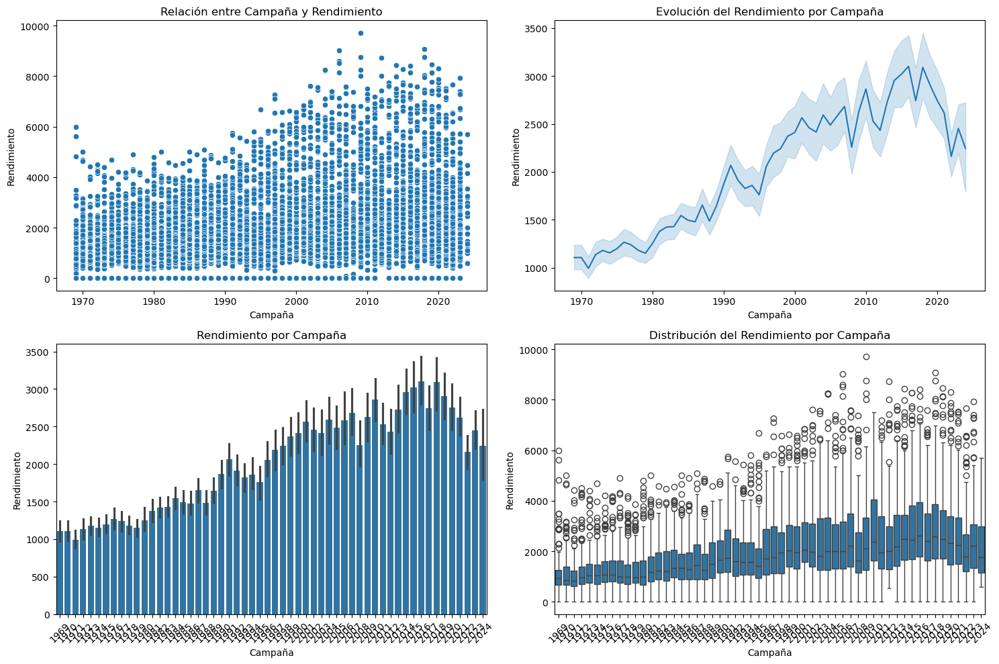

In [182]:
# Crear una figura con 4 subplots (2 filas, 2 columnas)
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Gráfico de dispersión - Evolución en el tiempo del Rendimiento
sns.scatterplot(x='Campaña', y='Rendimiento', data=df_estimacion_siembra, ax=axes[0, 0])
axes[0, 0].set_title('Relación entre Campaña y Rendimiento')

# Gráfico de líneas - Evolución en el tiempo del Rendimiento
sns.lineplot(x='Campaña', y='Rendimiento', data=df_estimacion_siembra, ax=axes[0, 1])
axes[0, 1].set_title('Evolución del Rendimiento por Campaña')

# Gráfico de barras - Evolución en el tiempo del Rendimiento
sns.barplot(x='Campaña', y='Rendimiento', data=df_estimacion_siembra, ax=axes[1, 0])
axes[1, 0].set_title('Rendimiento por Campaña')
axes[1, 0].tick_params(axis='x', rotation=45)

# Boxplot - Evolución en el tiempo del Rendimiento
sns.boxplot(x='Campaña', y='Rendimiento', data=df_estimacion_siembra, ax=axes[1, 1])
axes[1, 1].set_title('Distribución del Rendimiento por Campaña')
axes[1, 1].tick_params(axis='x', rotation=45)

# Ajustar el espaciado entre los subplots
plt.tight_layout()

# Mostrar la figura
plt.show()

In [183]:
# Verificamos que no queden cultivos sin registros en los años 2023
cultivo = df_estimacion_siembra['Cultivo'].unique()

for i in cultivo:
  print(f"Cultivo: {i} ultimo registro: {df_estimacion_siembra[df_estimacion_siembra['Cultivo']==i]['Campaña'].max()}")



Cultivo: Algodón ultimo registro: 2023
Cultivo: Alpiste ultimo registro: 2023
Cultivo: Arroz ultimo registro: 2023
Cultivo: Avena ultimo registro: 2023
Cultivo: Cártamo ultimo registro: 2023
Cultivo: Cebada cervecera ultimo registro: 2023
Cultivo: Centeno ultimo registro: 2023
Cultivo: Colza ultimo registro: 2023
Cultivo: Girasol ultimo registro: 2023
Cultivo: Lino ultimo registro: 2023
Cultivo: Maíz ultimo registro: 2023
Cultivo: Maní ultimo registro: 2023
Cultivo: Mijo ultimo registro: 2023
Cultivo: Poroto total ultimo registro: 2023
Cultivo: Soja total ultimo registro: 2023
Cultivo: Sorgo ultimo registro: 2023
Cultivo: Trigo candeal ultimo registro: 2024
Cultivo: Trigo total ultimo registro: 2024
Cultivo: Yerba mate ultimo registro: 2024


In [186]:
df_estimacion_siembra = df_estimacion_siembra[df_estimacion_siembra['Campaña']!=2024]

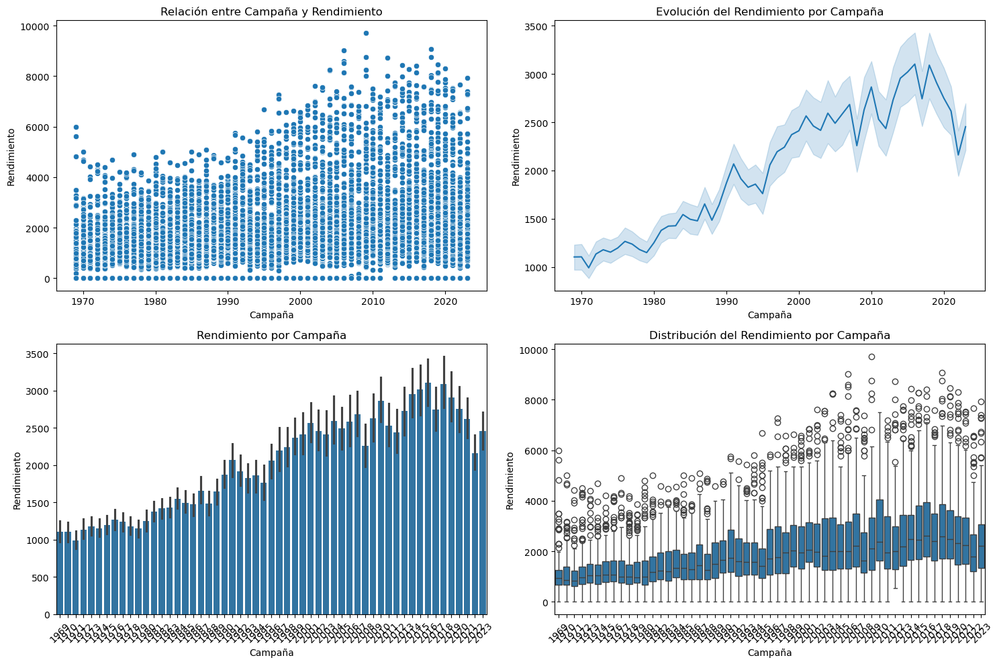

In [188]:
# Crear una figura con 4 subplots (2 filas, 2 columnas)
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Gráfico de dispersión - Evolución en el tiempo del Rendimiento
sns.scatterplot(x='Campaña', y='Rendimiento', data=df_estimacion_siembra, ax=axes[0, 0])
axes[0, 0].set_title('Relación entre Campaña y Rendimiento')

# Gráfico de líneas - Evolución en el tiempo del Rendimiento
sns.lineplot(x='Campaña', y='Rendimiento', data=df_estimacion_siembra, ax=axes[0, 1])
axes[0, 1].set_title('Evolución del Rendimiento por Campaña')

# Gráfico de barras - Evolución en el tiempo del Rendimiento
sns.barplot(x='Campaña', y='Rendimiento', data=df_estimacion_siembra, ax=axes[1, 0])
axes[1, 0].set_title('Rendimiento por Campaña')
axes[1, 0].tick_params(axis='x', rotation=45)

# Boxplot - Evolución en el tiempo del Rendimiento
sns.boxplot(x='Campaña', y='Rendimiento', data=df_estimacion_siembra, ax=axes[1, 1])
axes[1, 1].set_title('Distribución del Rendimiento por Campaña')
axes[1, 1].tick_params(axis='x', rotation=45)

# Ajustar el espaciado entre los subplots
plt.tight_layout()

# Mostrar la figura
plt.show()

In [189]:
df_estimacion_siembra

,Cultivo,Campaña,Provincia,Sup. Sembrada,Sup. Cosechada,Producción,Rendimiento
0,Algodón,1969,CATAMARCA,102,102,101,990
1,Algodón,1970,CATAMARCA,95,95,63,663
2,Algodón,1971,CATAMARCA,75,30,30,1000
3,Algodón,1972,CATAMARCA,80,80,68,850
4,Algodón,1973,CATAMARCA,190,80,52,650
...,...,...,...,...,...,...,...
8569,Cebada cervecera,2019,BUENOS AIRES,913410,913410,3650010,3204
8570,Cebada cervecera,2020,BUENOS AIRES,785353,785353,3556420,3631
8571,Cebada cervecera,2021,BUENOS AIRES,1217880,1217880,4819885,3173
8572,Cebada cervecera,2022,BUENOS AIRES,1230417,1230417,4258345,2775


In [213]:
#Resguardamos los cambios hechos en el set de datos
df_estimacion_siembra.to_csv(destino_archivos+'siembra-editado.csv', index=False)
